In [51]:
import os
import numpy as np
import pandas as pd

folder_path = r"C:\Users\Brendan\Downloads\Simmed Data"  # Update with the actual folder path

contents = ""  # String variable to store the contents of all text files

# Iterate through all files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".txt"):  # Consider only text files
        file_path = os.path.join(folder_path, file_name)
        with open(file_path, "r") as file:
            file_contents = file.read()
            contents += file_contents

# Print the combined contents of all text files
print(contents)

Guild: The WorId of FPL.ai
Channel: Bot Playground / coins
Topic: please thank the coin when you're done
After: 25-May-23 12:00 AM

[27-May-23 12:27 AM] Ali_-25#4073
.friendly eve cry


[27-May-23 12:27 AM] FPL.ai Game Engine#4359


{Embed}
Everton
```         1          
  3 - 2 - 13 - 19   
11 - 10 - 27 - 8 - 7
         20         ```
Starting XI
1\. Pickford
3\. Patterson
2\. Tarkowski
13\. Mina
19\. Mykolenko
11\. Gray
10\. Iwobi
27\. Gueye
8\. Onana
7\. McNeil
20\. Maupay
Subs
15\. Begovic
4\. Holgate
5\. Keane
14\. Townsend
16\. Doucoure
18\. Garner
26\. Davies
9\. Calvert-Lewin
25\. Simms
https://images-ext-2.discordapp.net/external/YZBcVsaEI0SzvjbCvE9D3fgUDol2uSCvCU-cdqPlQns/https/resources.premierleague.com/premierleague/badges/t11.png


[27-May-23 12:27 AM] FPL.ai Game Engine#4359


{Embed}
Crystal Palace
```      21     
2 - 5 - 4 - 3
    8 - 18   
 11 - 10 - 7 
      14     ```
Starting XI
21\. Johnstone
2\. Ward
5\. Richards
4\. Andersen
3\. Mitchell
8\. Doucoure
18\. McAr

In [52]:
fixtures = pd.read_csv(r"C:\Users\Brendan\Downloads\Simmed Data\Simmed FPL 2023.xlsx - Ticker.csv")
player_data = pd.read_csv(r"C:\Users\Brendan\Downloads\Simmed Data\Simmed FPL 2023.xlsx - Players.csv")

In [53]:
player_data

,Player,ID,Club,Apps,Mins,Points,Cost,Position,Goals,Assists,CS,Saves,YC,RC,Pen Miss,Pen Save,BPS,Bonus
0,Ramsdale,1,ARS,0,0,0,5.5,G,0,0,0,0,0,0,0,0,0,0
1,Saliba,2,ARS,0,0,0,5.5,D,0,0,0,0,0,0,0,0,0,0
2,Tierney,3,ARS,0,0,0,5.0,D,0,0,0,0,0,0,0,0,0,0
3,White,4,ARS,0,0,0,5.5,D,0,0,0,0,0,0,0,0,0,0
4,Partey,5,ARS,0,0,0,5.0,M,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508,T. Gomes,592,WOL,0,0,0,4.0,D,0,0,0,0,0,0,0,0,0,0
509,Bentley,593,WOL,0,0,0,4.5,G,0,0,0,0,0,0,0,0,0,0
510,Nunes,594,WOL,0,0,0,5.0,M,0,0,0,0,0,0,0,0,0,0
511,J. Gomes,595,WOL,0,0,0,4.5,M,0,0,0,0,0,0,0,0,0,0


In [54]:
class Player:
    def __init__(self, id, name, position, price , club):
        self.id = id
        self.name = name
        self.position = position
        self.price = price
        self.club = club
        self.games_started=0
        self.games_total=0
        self.all_games=0
        self.minutes = 0
        self.goals = 0
        self.assists = 0
        self.saves = 0
        self.shots=0
        self.key_passes=0
        self.points=0
        self.goals_per_game=0
        self.assists_per_game=0
        self.points_per_game=0
        self.price_per_ppg=0
    def update_games_started(self):
        self.games_started +=1
    def update_games_total(self):
        self.games_total +=1
    def update_minutes(self, minutes):
        self.minutes += minutes
    def update_goal(self):
        self.goals +=1
    def update_assist(self):
        self.assists +=1
    def update_points(self,points):
        self.points += points
    def update_per_game_stats(self,goals_per_game,assists_per_game,points_per_game,price_per_ppg):
        self.goals_per_game=goals_per_game
        self.assists_per_game=assists_per_game
        self.points_per_game=points_per_game
        self.price_per_ppg=price_per_ppg
class Club:
    def __init__(self, name, players):
        self.name = name
        self.players = players

class Match:
    def __init__(self, home_team, away_team, home_goals, away_goals, home_shots,away_shots):
        self.home_team = home_team
        self.away_team = away_team
        self.home_goals = home_goals
        self.away_goals = away_goals
        self.home_shots = home_shots
        self.away_shots = away_shots

In [55]:
player_stats=[]
for i, row in player_data.iterrows(): 
    player_stats.append(Player(i,player_data.loc[i].at['Player'],player_data.loc[i].at['Position'],player_data.loc[i].at['Cost'],player_data.loc[i].at['Club']))

In [56]:
import re
short_clubs=pd.unique(player_data['Club']).tolist()
short_clubs

['ARS',
 'AVL',
 'BOU',
 'BRE',
 'BHA',
 'CHE',
 'CRY',
 'EVE',
 'FUL',
 'LEE',
 'LEI',
 'LIV',
 'MCI',
 'MUN',
 'NEW',
 'NFO',
 'SOU',
 'TOT',
 'WHU',
 'WOL']

In [57]:
clubs = ['Arsenal', 'Aston Villa', 'Bournemouth', 'Brentford', 'Brighton', 'Chelsea', 'Crystal Palace', 'Everton', 'Fulham',
         'Leeds', 'Leicester', 'Liverpool', 'Man City', 'Man Utd', 'Newcastle', 'Nottm Forest', 'Southampton', 'Spurs', 'West Ham', 'Wolves']

In [58]:
def calculate_player_stats(players1, players2, commentary, teams_playing):
    club1=short_clubs[clubs.index(teams_playing[1])]
    club2=short_clubs[clubs.index(teams_playing[0])]
    player_keys1 = []
    player_keys2 = []
    for i in players1:
        for player in player_stats:
            if player.club == club1 and player.name == i:
                player_keys1.append(player.id)
    for i in players2:
        for player in player_stats:
            if player.club == club2 and player.name == i:
                player_keys2.append(player.id)
    for i in player_keys1[0:11]:
        player_stats[i].update_games_started() 
        player_stats[i].update_minutes(90) 
    for i in player_keys2[0:11]:
        player_stats[i].update_games_started() 
        player_stats[i].update_minutes(90) 
    for player in player_stats:
        if(player.club ==club1 or player.club ==club2):
            player.update_games_total()
    i=0
    for event in commentary:
        #Shots taken
        if "GOAL!" in commentary[i]:
            match = re.search(r'\*\*(.*?)\*\*', commentary[i])
            if match:    
                goal_scorer=match.group(1)[6:]
            if commentary[i+1] != ":a: *(Assist - none)*":
                # Extract the assister's name
                assist_player = re.search(r"\(Assist - ([^\)]+)\)", commentary[i+1]).group(1)
            else:
                assist_player = None
            # Find the goal scorer and assister in the player_stats list
            goal_scorer_player = next((player for player in player_stats if (player.name == goal_scorer)and (player.club==club1 or player.club==club2)), None)
            assist_player = next((player for player in player_stats if (player.name == assist_player)and (player.club==club1 or player.club==club2)), None)

            # Perform updates if players are found and their clubs match
            if goal_scorer_player:
                goal_scorer_player.update_goal()
            if assist_player:
                assist_player.update_assist()
        elif ":twisted_rightwards_arrows:" in commentary[i]:
            time_subbed=int(commentary[i][:2].replace("'",""))
            subbed_in=commentary[i+1].replace(":greenarrow: ","")
            subbed_out=commentary[i+2].replace(":redarrow: ","")
            subbed_in_player = next((player for player in player_stats if (player.name == subbed_in)and (player.club==club1 or player.club==club2) and (player.id in player_keys1[11:]or player.id in player_keys2[11:])), None)
            subbed_out_player = next((player for player in player_stats if (player.name == subbed_out)and (player.club==club1 or player.club==club2)and (player.id in player_keys1[:11]or player.id in player_keys2[:11])), None)
            if subbed_in_player:
                subbed_in_player.update_minutes(90-time_subbed)
            if subbed_out_player:
                subbed_out_player.update_minutes(90-time_subbed)

        i=i+1



In [59]:

matches=[]
match_stats=[]
lines = contents.splitlines()
teamcount=0
players1=[]
players2=[]
teams_playing=[]
teams_playing2=" "
z=0
for i in range(len(lines)):
    if i > 0 and lines[i] in clubs and lines[i-1] == "{Embed}":
        matches.append(lines[i])
        teams_playing.append(lines[i])
        teamcount=teamcount+1
        j=i
        while "Starting XI" not in lines[j]:
            j=j+1
        if(teamcount%2==0):  
            for k in range(1,12):
                players1.append(re.sub(r'\d+\.\s', '',lines[j+k].replace("/","").replace("\\","")))
            for k in range(13,22):
                players1.append(re.sub(r'\d+\.\s', '',lines[j+k].replace("/","").replace("\\","")))
        else:
            for k in range(1,12):
                players2.append(re.sub(r'\d+\.\s', '',lines[j+k].replace("/","").replace("\\","")))
            for k in range(13,22):
                players2.append(re.sub(r'\d+\.\s', '',lines[j+k].replace("/","").replace("\\","")))
        commentary=[]
        if(teamcount%2==0):   
            j=j+k+2
            while "Full-time" not in lines[j]:
                if "FPL.ai Game Engine" not in lines[j] and len(lines[j]) != 0:
                    commentary.append(lines[j])
                j=j+1
            if(lines[j][15].isdigit() and lines[j][17].isdigit() ):
                numbers = lines[j+1].split("-")
                numbers[0]=numbers[0].replace("Shots: ","")
                match_stats.append(Match(lines[j][11:14],lines[j][19:22],lines[j][15],lines[j][17],numbers[0],numbers[1]))
            # score1=Match()
            calculate_player_stats(players1, players2, commentary, teams_playing)
            players1.clear()
            players2.clear()
            teams_playing.clear()
    elif i>0 and "Full-time" in lines[i]:
        matches.append(lines[i].replace('Full-time: ', ''))
        teams_playing2=lines[i].replace('Full-time: ', '')
        x=0
        while("Bonus Points" not in lines[i+x]):
            a=1
            if("Embed" in lines[i+x]): 
                while("https" not in lines[i+x+a]):
                    if (a%2==1):
                        scorer_player = next((player for player in player_stats if (player.name == lines[i+x+a])and (player.club==teams_playing2[:3] or player.club==teams_playing2[8:])), None)
                        if(scorer_player!=None):
                            scorer_player.update_points(int(lines[i+x+a+1][:2]))
                        
                    a=a+1
            x=x+1
    elif i>0 and "Shots: " in lines[i]:
        matches.append(lines[i].replace('Shots: ', ''))
# temp=" "
# temp=temp.join(clubs)
# for i in range(len(lines)):
#     # Regular expression patterns
#     pattern = r"([A-Z]{3})\s+(\d+-\d+)\s+([A-Z]{3})"
#     matches = re.search(pattern, lines[i])
#     pattern = r"Shots: \d+-\d+"
#     matched_rows = re.search(pattern, lines[i])
#     print(matches)
    

    

Pickford
10 pts (30 BPS)
Patterson
9 pts (32 BPS)
Tarkowski
6 pts (20 BPS)
Mina
6 pts (24 BPS)
Mykolenko
6 pts (22 BPS)
Gray
1 pts (3 BPS)
Iwobi
3 pts (14 BPS)
Gueye
3 pts (18 BPS)
Onana
3 pts (11 BPS)
McNeil
3 pts (6 BPS)
Maupay
2 pts (6 BPS)
Townsend
1 pts (3 BPS)
Garner
1 pts (3 BPS)
Calvert-Lewin
1 pts (3 BPS)
Johnstone
7 pts (24 BPS)
Ward
6 pts (23 BPS)
Richards
6 pts (21 BPS)
Andersen
7 pts (26 BPS)
Mitchell
6 pts (23 BPS)
Doucoure
3 pts (17 BPS)
McArthur
3 pts (8 BPS)
Zaha
3 pts (8 BPS)
Eze
1 pts (3 BPS)
Olise
3 pts (13 BPS)
Mateta
2 pts (6 BPS)
Schlupp
1 pts (4 BPS)
Ebiowei
1 pts (4 BPS)
Edouard
1 pts (3 BPS)
Lloris
1 pts (10 BPS)
Royal
1 pts (17 BPS)
Romero
1 pts (16 BPS)
Dier
1 pts (12 BPS)
Udogie
1 pts (10 BPS)
Hojbjerg
2 pts (12 BPS)
Bentancur
2 pts (11 BPS)
Kulusevski
2 pts (8 BPS)
Lo Celso
2 pts (7 BPS)
Son
2 pts (7 BPS)
Kane
8 pts (29 BPS)
Perisic
1 pts (2 BPS)
Gil
1 pts (4 BPS)
Richarlison
4 pts (13 BPS)
Martinez
2 pts (10 BPS)
Cash
2 pts (11 BPS)
Mings
2 pts (8 BPS)
Ca

In [60]:
for index in range(0,512):
    if(player_stats[index].minutes!=0):
        g_per_90=player_stats[index].goals/player_stats[index].minutes
        a_per_90=player_stats[index].assists/player_stats[index].minutes
        p_per_90=player_stats[index].points/player_stats[index].minutes
        pppg=p_per_90/player_stats[index].price
    else:
        g_per_90=0
        a_per_90=0
        p_per_90=0
        pppg=0
    player_stats[index].update_per_game_stats(g_per_90,a_per_90,p_per_90,pppg)

In [61]:
for index in range(0,512):
    print(player_stats[index].name + " " + str(player_stats[index].games_total)+ " "+str(player_stats[index].games_started)+" " +str(player_stats[index].goals)+" "+str(player_stats[index].assists)+" "+str(player_stats[index].points))

Ramsdale 92 92 0 0 378
Saliba 92 92 6 1 428
Tierney 92 11 0 3 112
White 92 90 6 2 419
Partey 92 59 7 6 227
Gabriel 92 88 13 2 452
Saka 92 92 29 24 566
Odegaard 92 90 23 24 491
Jesus 92 65 20 16 294
Smith-Rowe 92 0 4 3 87
Martinelli 92 90 28 27 522
Tavares 92 0 0 0 0
Nketiah 92 25 10 3 144
Kiwior 92 4 0 0 19
Holding 92 0 0 0 0
Cedric 92 0 0 0 0
Tomiyasu 92 2 0 1 12
Trossard 92 4 4 11 151
Jorginho 92 32 4 5 129
Vieira 92 2 1 1 35
Balogun 92 0 0 0 2
Lokonga 92 0 0 0 0
Nelson 92 0 0 0 0
Elneny 92 1 0 0 3
Turner 92 0 0 0 2
Hein 92 0 0 0 0
Xhaka 92 92 9 23 393
Zinchenko 92 81 7 9 458
Martinez 62 62 0 0 279
Cash 62 53 0 1 226
Carlos 62 60 5 0 262
Konsa 62 2 1 0 13
Mings 62 62 1 0 244
Luiz 62 57 8 14 273
McGinn 62 5 1 1 52
Ramsey 62 62 7 7 225
Traore 62 4 3 1 79
Buendia 62 60 8 7 221
Watkins 62 61 18 4 259
Sinisalo 62 0 0 0 0
Moreno 62 54 0 4 228
Chambers 62 0 0 0 0
Young 62 9 0 2 42
Nakamba 62 0 0 0 5
Duran 62 0 1 0 21
Coutinho 62 2 2 2 67
Digne 62 8 2 8 109
Philogene 62 0 0 0 0
Bailey 62 58 

In [62]:
# Define an empty dictionary to store the player data
player_data = {
    'id': [],
    'name': [],
    'position': [],
    'price': [],
    'club': [],
    'games_started': [],
    'games_total': [],
    'all_games': [],
    'minutes': [],
    'goals': [],
    'assists': [],
    'saves': [],
    'shots': [],
    'key_passes': [],
    'points': [],
    'goals_per_game': [],
    'assists_per_game': [],
    'points_per_game': [],
    'price_per_ppg': []
}

# Iterate over the Player objects and extract their attributes
for player in player_stats:
    player_data['id'].append(player.id)
    player_data['name'].append(player.name)
    player_data['position'].append(player.position)
    player_data['price'].append(player.price)
    player_data['club'].append(player.club)
    player_data['games_started'].append(player.games_started)
    player_data['games_total'].append(player.games_total)
    player_data['all_games'].append(player.all_games)
    player_data['minutes'].append(player.minutes)
    player_data['goals'].append(player.goals)
    player_data['assists'].append(player.assists)
    player_data['saves'].append(player.saves)
    player_data['shots'].append(player.shots)
    player_data['key_passes'].append(player.key_passes)
    player_data['points'].append(player.points)
    player_data['goals_per_game'].append(player.goals_per_game)
    player_data['assists_per_game'].append(player.assists_per_game)
    player_data['points_per_game'].append(player.points_per_game)
    player_data['price_per_ppg'].append(player.price_per_ppg)

# Create the DataFrame from the player_data dictionary
df = pd.DataFrame(player_data)

df=df.set_index('id')
df = df[df['games_started']/df['games_total'] > 0.6] 

In [63]:
df.sort_values(by='points_per_game', ascending=False).head(20)

,name,position,price,club,games_started,games_total,all_games,minutes,goals,assists,saves,shots,key_passes,points,goals_per_game,assists_per_game,points_per_game,price_per_ppg
id,,,,,,,,,,,,,,,,,,
336,Rashford,M,10.0,MUN,140,154,0,12762,93,39,0,0,0,1090,0.007287,0.003056,0.085410,0.008541
355,Trippier,D,6.5,NEW,90,92,0,8192,2,26,0,0,0,584,0.000244,0.003174,0.071289,0.010968
308,Haaland,F,13.5,MCI,167,187,0,15968,129,7,0,0,0,1130,0.008079,0.000438,0.070767,0.005242
334,Fernandes,M,9.0,MUN,154,154,0,15051,37,68,0,0,0,1049,0.002458,0.004518,0.069696,0.007744
301,Alexander-Arnold,D,7.0,LIV,105,108,0,9550,12,33,0,0,0,618,0.001257,0.003455,0.064712,0.009245
6,Saka,M,9.0,ARS,92,92,0,8807,29,24,0,0,0,566,0.003293,0.002725,0.064267,0.007141
212,Mitrovic,F,7.5,FUL,185,192,0,16707,95,18,0,0,0,1042,0.005686,0.001077,0.062369,0.008316
361,Wilson,F,8.5,NEW,84,92,0,7815,44,8,0,0,0,484,0.005630,0.001024,0.061932,0.007286
357,Schar,D,5.5,NEW,92,92,0,8280,9,0,0,0,0,512,0.001087,0.000000,0.061836,0.011243


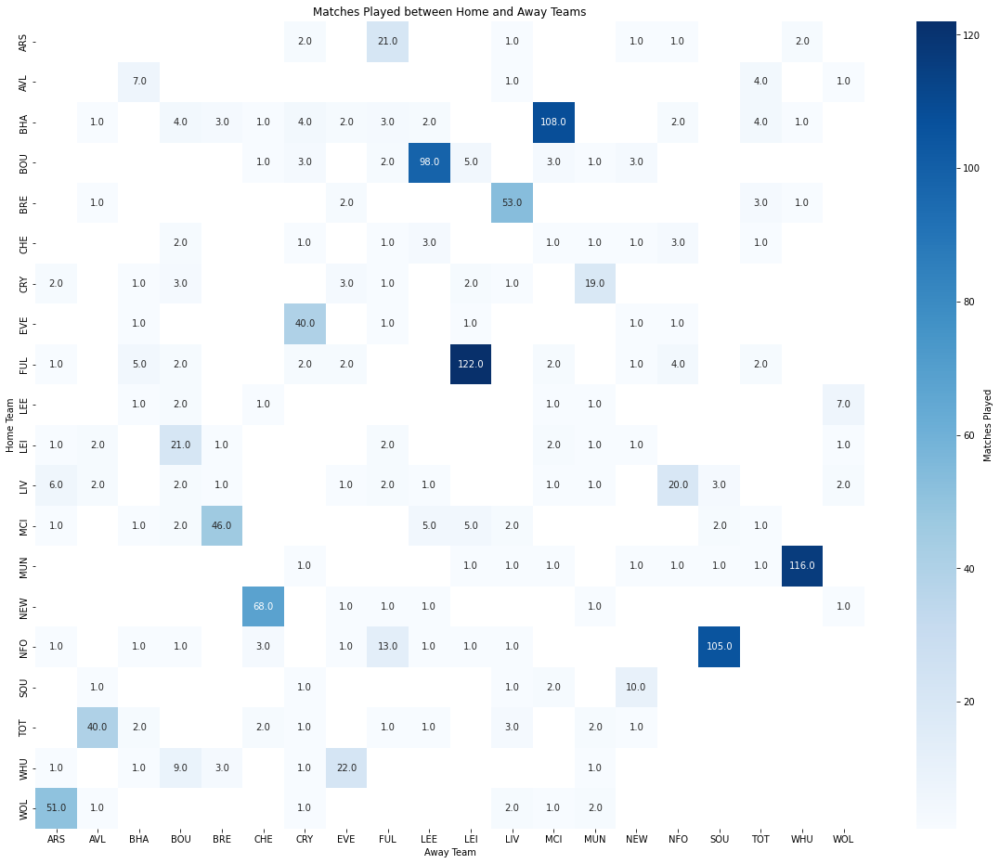

In [64]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a list of Match objects called match_stats

# Create a list to store the match data
match_data = []

# Iterate over the Match objects and extract the relevant attributes
for match in match_stats:
    match_data.append([match.home_team, match.away_team, match.home_goals, match.away_goals, match.home_shots, match.away_shots])

# Create a DataFrame from the match data
df2 = pd.DataFrame(match_data, columns=['Home Team', 'Away Team', 'Home Goals', 'Away Goals', 'Home Shots', 'Away Shots'])

# Group the data by home and away teams
grouped = df2.groupby(['Home Team', 'Away Team']).agg({
    'Home Goals': 'mean',
    'Away Goals': 'mean',
    'Home Shots': 'mean',
    'Away Shots': 'mean',
    'Home Team': 'count'
}).rename(columns={'Home Team': 'Matches Played'})

# Reshape the data to create a pivot table
heatmap_data = grouped.pivot_table(index='Home Team', columns='Away Team', values='Matches Played')

# Create a heatmap using seaborn
plt.figure(figsize=(20, 16))
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt=".1f", cbar_kws={'label': 'Matches Played'})
plt.title('Matches Played between Home and Away Teams')
plt.xlabel('Away Team')
plt.ylabel('Home Team')
plt.show()


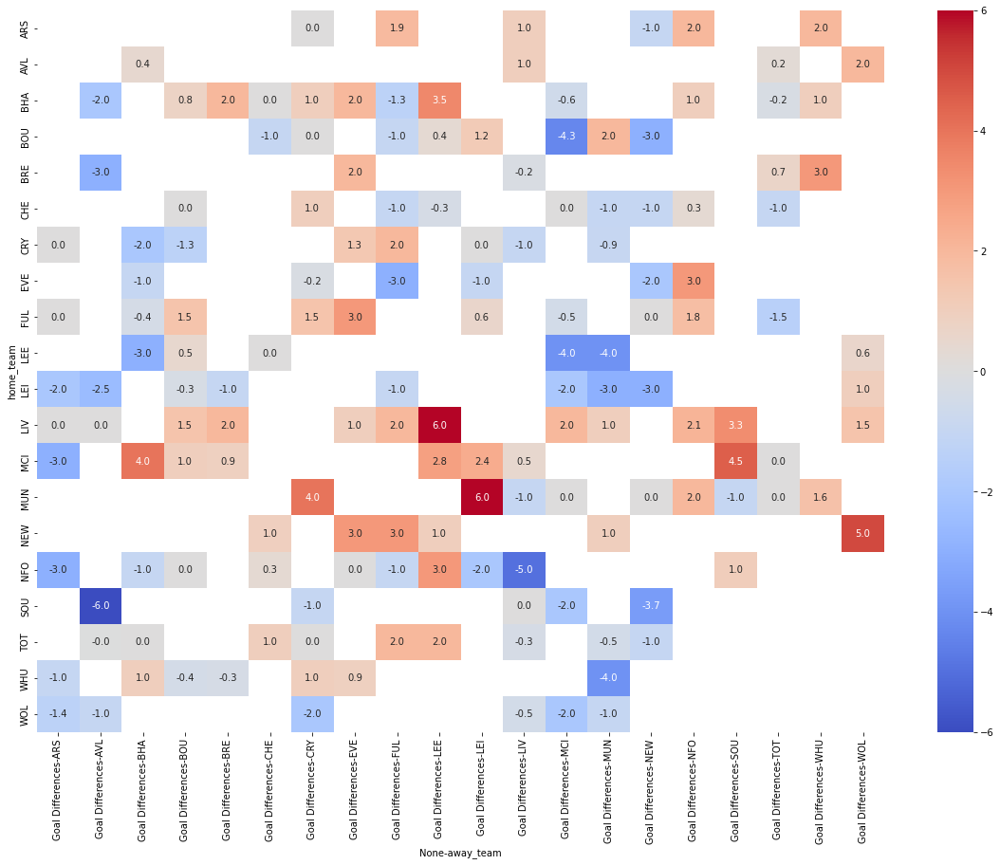

In [65]:
# Create a dataframe from the match_stats list
df2 = pd.DataFrame([vars(match) for match in match_stats])
df2[['home_goals','away_goals','home_shots','away_shots']] = df2[['home_goals','away_goals','home_shots','away_shots']].astype(int)
# Calculate average score and shots for each matchup
average_scores = df2.groupby(['home_team', 'away_team'])[['home_goals', 'away_goals']].mean()
average_shots = df2.groupby(['home_team', 'away_team'])[['home_shots', 'away_shots']].mean()
average_scores["Goal Differences"]=average_scores['home_goals']-average_scores['away_goals']
# Reshape the data for visualization
scores_heatmap = average_scores.pivot_table(index='home_team', columns='away_team', values=["Goal Differences"])
# shots_heatmap = average_shots.pivot_table(index='home_team', columns='away_team', values=['home_shots'])
plt.figure(figsize=(20, 14))
# Plot the heatmap for average scores
sns.heatmap(scores_heatmap, annot=True, cmap='coolwarm', fmt=".1f", cbar=True)

# # Plot the heatmap for average shots
# sns.heatmap(shots_heatmap, annot=True, cmap='Blues', fmt=".1f",cbar=True)

# Show the plots
plt.show()

In [66]:
average_scores = df2.groupby(['home_team', 'away_team'])[['home_goals', 'away_goals']].mean()
average_scores["Goal Differences"]=average_scores['home_goals']-df2['away_goals']
average_scores

ValueError: cannot join with no overlapping index names

In [ ]:

average_scores.tail(50)

home_goals  away_goals
home_team away_team                        
MUN       LIV          2.000000    3.000000
          MCI          0.000000    0.000000
          NEW          1.000000    1.000000
          NFO          3.000000    1.000000
          SOU          2.000000    3.000000
          TOT          0.000000    0.000000
          WHU          2.534483    0.913793
NEW       CHE          1.382353    0.411765
          EVE          3.000000    0.000000
          FUL          3.000000    0.000000
          LEE          1.000000    0.000000
          MUN          2.000000    1.000000
          WOL          5.000000    0.000000
NFO       ARS          1.000000    4.000000
          BHA          0.000000    1.000000
          BOU          0.000000    0.000000
          CHE          2.000000    1.666667
          EVE          2.000000    2.000000
          FUL          0.769231    1.769231
          LEE          4.000000    1.000000
          LEI          2.000000    4.000000
          LIV          0.000000    5.000000
          SOU          2.266667    1.228571
SOU       AVL          1.000000    7.000000
          CRY          0.000000    1.000000
          LIV          2.000000    2.000000
          MCI          1.000000    3.000000
          NEW          0.100000    3.800000
TOT       AVL          0.875000    0.900000
          BHA          1.500000    1.500000
          CHE          1.500000    0.500000
          CRY          1.000000    1.000000
          FUL          3.000000    1.000000
          LEE          3.000000    1.000000
          LIV          0.333333    0.666667
          MUN          0.500000    1.000000
          NEW          0.000000    1.000000
WHU       ARS          2.000000    3.000000
          BHA          2.000000    1.000000
          BOU          1.222222    1.666667
          BRE          1.333333    1.666667
          CRY          1.000000    0.000000
          EVE          1.954545    1.045455
          MUN          0.000000    4.000000
WOL       ARS          0.647059    2.000000
          AVL          3.000000    4.000000
          CRY          1.000000    3.000000
          LIV          1.000000    1.500000
          MCI          1.000000    3.000000
          MUN          1.000000    2.000000